<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "title"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">&#8759; Keratoconus Eye Disease Detection Using Deep Learning
    </h1>
</div>

In [ ]:


import numpy as npy # linear algebra
import pandas as pds # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator as ImgDataGen

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input, EfficientNetB3


In [3]:
# Specify important directories
import os, sys, time, warnings, sklearn, random, shutil
ROOT='/kaggle/input'
# ROOT='dataset'
TRAIN_PATH=ROOT+'/keratoconus-detection/Train_Validation sets/Train_Validation sets'
TEST_PATH=ROOT+'/keratoconus-detection/Independent Test Set/Independent Test Set'
# TRAIN_PATH=ROOT+'/Train_Validation sets/Train_Validation sets'
# TEST_PATH=ROOT+'/Independent Test Set/Independent Test Set'
train_kcn_img_path=TRAIN_PATH +'/Keratoconus'

MODEL_PATH='models'
IMAGE_PATH='images'
MOD_DATA='../mod_data'
MOD_DATA_TRAIN=MOD_DATA+'/train'
MOD_DATA_VAL=MOD_DATA+'/validation'

OVERSAMPLED_TRAIN_PATH=MOD_DATA+'/fed_oversampled/train'

# Model Architecture path
def model_arch(model_name):
    # !mkdir images
    arch=IMAGE_PATH+'/keratoconus_'+model_name+'.png'
    return arch

#  TensorFlow Checkpoint save_weight uses .ckpt extension format
def checkpoint_path(model_name):
    # !mkdir models
    checkpoint_path=MODEL_PATH+"/keratoconus_best_model-"+model_name+".ckpt"
    return checkpoint_path

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "exploratory-da"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Exploratory Data Analysis
    </h1>
</div>

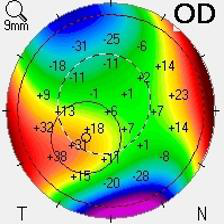

In [4]:
# Load a sample image 
# using open() to open images
image_data=Image.open(train_kcn_img_path+'/case1/KCN_1_EC_A.jpg')
image_data


Image shape: (224, 224, 3)
Image data array: [[[238 238 238]
  [250 250 250]
  [235 235 235]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[246 246 246]
  [236 236 236]
  [242 242 242]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[229 229 229]
  [255 255 255]
  [236 236 236]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 ...

 [[240 240 240]
  [240 240 240]
  [240 240 240]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[240 240 240]
  [240 240 240]
  [240 240 240]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[240 240 240]
  [240 240 240]
  [240 240 240]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]]
Image array shape: (224, 224, 3)


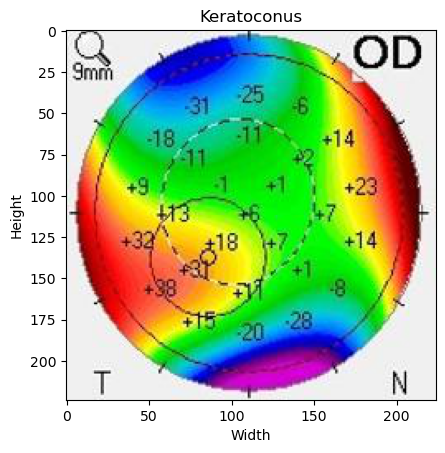

In [5]:
# Get the shape of the image
image=plt.imread(train_kcn_img_path+'/case1/KCN_1_EC_A.jpg')
# print(image.astype)
print(f'\nImage shape: {image.shape}')

# Convert image data (like jpeg) to numpy using asarray()
image_array = npy.asarray(image_data)
print(f'Image data array: {image_array}')

# Get the shape of the image array
print(f'Image array shape: {image_array.shape}')

# Printing the image 
plt.imshow(image_array)
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Keratoconus')
plt.show()

In [6]:
# Get the list of folders in the directory as classes
class_dir=os.listdir(TRAIN_PATH+'/')
class_dir

['Keratoconus', 'Normal', 'Suspect']

In [7]:
# Get dictionary, list of image count per class
def class_sample(type):
    if os.path.isdir(type):
        path=type
        filepath=path+'/'
        class_count = []
        class_dict ={}
        for folder in os.listdir(filepath) :
              class_dict[folder] = sum([len(files) for r, d, files in os.walk(filepath+folder)])
              class_count.append(sum([len(files) for r, d, files in os.walk(filepath+folder)]))
        class_total = sum(class_count)
        return class_total, class_count, class_dict
    else:
        raise FileNotFoundError('No such file or directory: ', type)

def pathType(path):
        type = ""
        if 'train' in os.path.basename(path).lower():
            type = "train"
        elif 'test' in os.path.basename(path).lower():
            type = "test"
        elif 'validation' in os.path.basename(path).lower():
            type = "validation"
        else:
            raise ValueError('We could not identify your your dataset type, \n Use correct dataset type for your directory name.')
        return type
        
def test_train_distribution(paths = []):
      for path in paths:
        type = pathType(path)
        print(f"\n---- {type.capitalize()} Set ----")
        avg_train=class_sample(path)[0]/len(class_sample(path)[1])
        print(f'{type.capitalize()} class distribution:\n{class_sample(path)[2]}')
        print(f"Average {type} class: {round(avg_train)}")    
        print(f'Total {type} set:  {class_sample(path)[0]}')


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "data-visualization"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Data Visualization
    </h1>
</div>

## Outliers Detection

1/1 [==============================] - 0s 31ms/step


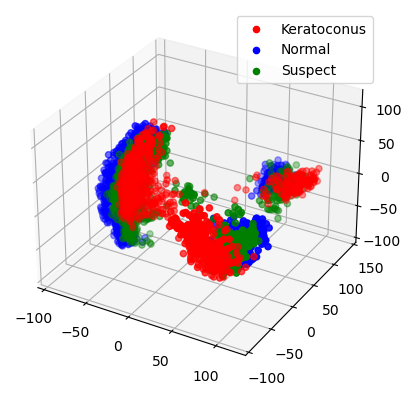

In [8]:
# Outliers detection
from tensorflow.keras.preprocessing import image
# Load pre-trained model
model = EfficientNetB3(include_top=False, weights='imagenet')

# Extract features from images
img_size = (224, 224)
kcn_path = TRAIN_PATH+'/Keratoconus'
ccn_path = TRAIN_PATH+'/Normal'
scn_path = TRAIN_PATH+'/Suspect'

def extract_features(path):
    features = []
    labels = []
    for root, dirs, files in os.walk(path):
        for file in files:
            img_path = os.path.join(root, file)
            img = image.load_img(img_path, target_size=img_size)
            x = image.img_to_array(img)
            x = preprocess_input(x)
            x = npy.expand_dims(x, axis=0)
            features.append(model.predict(x))
            labels.append(root.split('/')[-1])
    features = npy.vstack(features)
    labels = npy.array(labels)
    return features, labels

kcn_features, kcn_labels = extract_features(kcn_path)
ccn_features, ccn_labels = extract_features(ccn_path)
scn_features, scn_labels = extract_features(scn_path)

# Apply dimensionality reduction
pca = PCA(n_components=3)
kcn_pca = pca.fit_transform(kcn_features.reshape(kcn_features.shape[0], -1))
ccn_pca = pca.fit_transform(ccn_features.reshape(ccn_features.shape[0], -1))
scn_pca = pca.fit_transform(scn_features.reshape(scn_features.shape[0], -1))

# Plot 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(kcn_pca[:,0], kcn_pca[:,1], kcn_pca[:,2], c='r', label='Keratoconus')
ax.scatter(ccn_pca[:,0], ccn_pca[:,1], ccn_pca[:,2], c='b', label='Normal')
ax.scatter(scn_pca[:,0], scn_pca[:,1], scn_pca[:,2], c='g', label='Suspect')
ax.legend()
plt.show()


In [9]:
def visualizeData(train, test=''):
        df_train = pds.DataFrame(list(class_sample(train)[2].items()), columns=['Condition', 'Count'])
        df_train.index.name = 'Condition'
        df_test = pds.DataFrame(list(class_sample(test)[2].items()), columns=['Condition', 'Count'])
        df_test.index.name = 'Condition'


        # plot a barplot with vertical orientation
        sns.set()
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        axis = sns.barplot(x='Condition', y='Count', data=df_train, orient='v', palette='bright')
        # set labels and title
        plt.xlabel("Eye Condition", fontsize=12)
        plt.ylabel("Count", fontsize=12)
        plt.title(f"(a). Distribution of The {pathType(train).capitalize()} Images", fontsize=15)

        plt.subplot(1, 2, 2)
        sns.barplot(x='Condition', y='Count', data=df_test, orient='v', palette='bright')
        plt.xlabel("Eye Condition", fontsize=12)
        plt.ylabel("Count", fontsize=12)
        plt.title(f"(b). Distribution of The {pathType(test).capitalize()} Images", fontsize=15)
        plt.show()

        print('\n\n')
        # Get the list of folders in the directory as classes
        class_dir=os.listdir(TRAIN_PATH+'/')
        class_dir
        x_train = npy.array([ len(os.listdir(train+'/'+class_name+'/')) for class_name in class_dir])
        x_test = npy.array([ len(os.listdir(test+'/'+class_name+'/')) for class_name in class_dir])
        label = class_dir
        
        # plot a Pie plot with vertical orientation
        plt.figure(figsize=(10, 5))
        ax = plt.subplot(1, 2, 1)
        # define Seaborn color palette to use
        palette_color = sns.color_palette('bright')
        explode = [0.1, 0.002, 0] 


        plt.pie(x_train, labels=label, explode=explode, colors=palette_color, autopct='%1.1f%%', startangle=90)
        ax.set_title(f'(a). Pie Plot of The {pathType(train).capitalize()} Images', fontsize=15)

        ay = plt.subplot(1, 2, 2)
        plt.pie(x_test, labels=label, explode=explode, colors=palette_color, autopct='%1.1f%%', startangle=90)
        ay.set_title(f'(b). Pie Plot of The {pathType(test).capitalize()} Images', fontsize=15)
        plt.show()


---- Train Set ----
Train class distribution:
{'Keratoconus': 1050, 'Normal': 1050, 'Suspect': 861}
Average train class: 987
Total train set:  2961

---- Test Set ----
Test class distribution:
{'Keratoconus': 350, 'Normal': 350, 'Suspect': 350}
Average test class: 350
Total test set:  1050


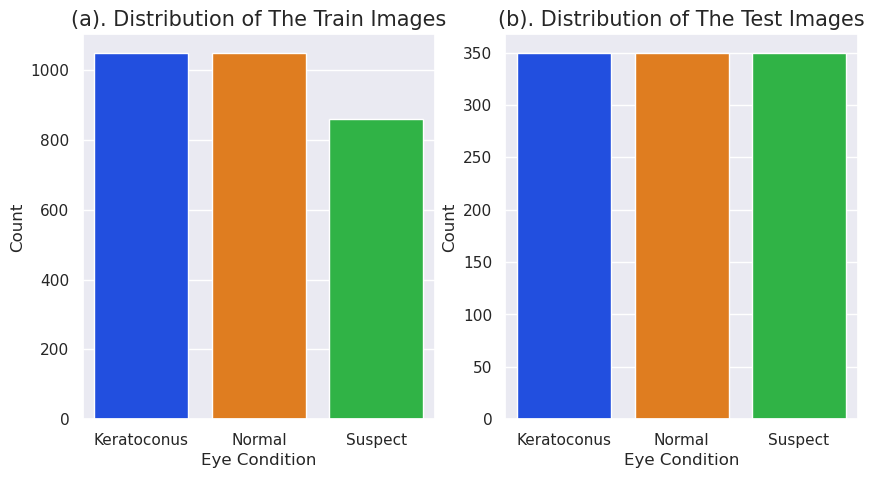

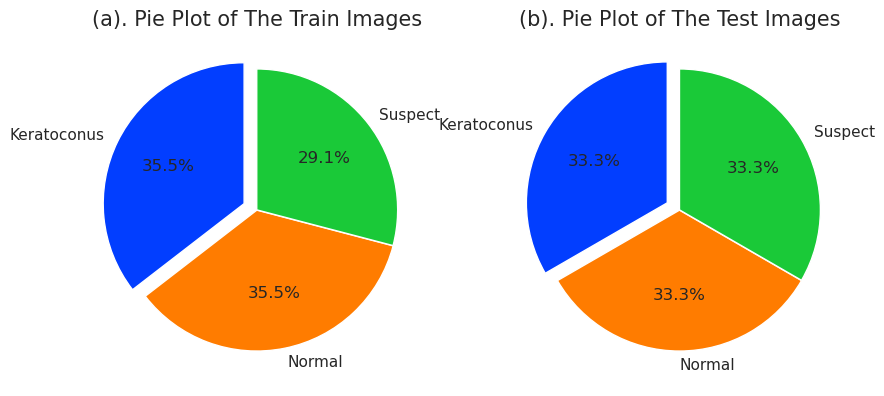

In [10]:


test_train_distribution([TRAIN_PATH, TEST_PATH])
visualizeData(TRAIN_PATH, TEST_PATH)

## Train - Validation Set Split

In [11]:

# Set your root directory path
root_dir = TRAIN_PATH

# Set your train and validation directory paths
train_dir = MOD_DATA_TRAIN
val_dir = MOD_DATA_VAL

# Set the percentage of data to use for validation
val_percentage = 0.3

# Iterate through each class directory
for class_dir in os.listdir(root_dir):
    # Create the class directories in the train and validation directories
    os.makedirs(os.path.join(train_dir, class_dir), exist_ok=True)
    os.makedirs(os.path.join(val_dir, class_dir), exist_ok=True)

    # Iterate through each case directory
    for case_dir in os.listdir(os.path.join(root_dir, class_dir)):
        # Get a list of all the image files in the case directory
        image_files = [f for f in os.listdir(os.path.join(root_dir, class_dir, case_dir)) if f.endswith(".jpg")]

        # Shuffle the list of image files
        random.shuffle(image_files)

        # Split the list of image files into train and validation sets
        val_size = int(len(image_files) * val_percentage)
        train_images = image_files[val_size:]
        val_images = image_files[:val_size]

        if os.path.exists(os.path.join(train_dir, class_dir, case_dir)):
            shutil.rmtree(os.path.join(train_dir, class_dir, case_dir))
        os.mkdir(os.path.join(train_dir, class_dir, case_dir))

        if os.path.exists(os.path.join(val_dir, class_dir, case_dir)):
            shutil.rmtree(os.path.join(val_dir, class_dir, case_dir))
        os.mkdir(os.path.join(val_dir, class_dir, case_dir))
    
        # Copy the train images to the train directory
        for image_file in train_images:
            src_path = os.path.join(root_dir, class_dir, case_dir, image_file)
            dst_path = os.path.join(train_dir, class_dir, case_dir, image_file)
            shutil.copy(src_path, dst_path)

        # Copy the validation images to the validation directory
        for image_file in val_images:
            src_path = os.path.join(root_dir, class_dir, case_dir, image_file)
            dst_path = os.path.join(val_dir, class_dir, case_dir, image_file)
            # if os.path.exists(os.path.join(val_dir, class_dir, case_dir)):
                # shutil.rmtree(os.path.join(val_dir, class_dir, case_dir))
            # os.mkdir(os.path.join(val_dir, class_dir, case_dir))
            shutil.copy(src_path, dst_path)
# Display a message indicating that the train validation split is completed
print("Train - Validation Split  completed.")

Train - Validation Split  completed.



---- Train Set ----
Train class distribution:
{'Suspect': 615, 'Keratoconus': 750, 'Normal': 750}
Average train class: 705
Total train set:  2115

---- Validation Set ----
Validation class distribution:
{'Suspect': 246, 'Keratoconus': 300, 'Normal': 300}
Average validation class: 282
Total validation set:  846


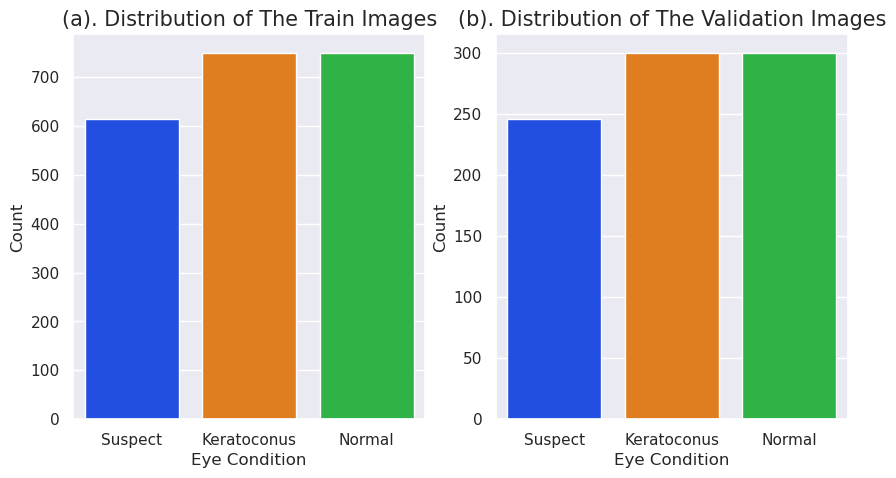

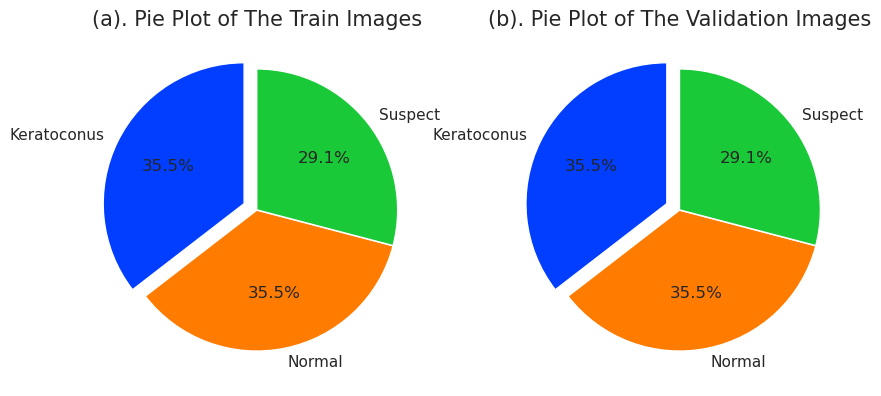

In [12]:
test_train_distribution(paths=[train_dir, val_dir])
visualizeData(train_dir, val_dir)


## Oversampling Technique

In [13]:
# Perform a bit of image transformation on the class of image to be duplicated 
# (Suspect class) and move the duplicated forlder to the suspect folder

train_dir = MOD_DATA_TRAIN

# Create an ImageDataGenerator object
datagen = ImgDataGen(
    # rescale=1./255,
    rotation_range=5,
)

# Get the number of samples for each class in the train_dir
class_counts = {}
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):
        class_counts[class_name] = len(os.listdir(class_path))
        print (class_path,': ',len(os.listdir(class_path)))

# Find the maximum number of samples among all classes
max_class_count = max(class_counts.values())
print('max class count: ', max_class_count)

# Calculate the number of batches needed to achieve balance
num_batches = {class_name: int(max_class_count/class_count) for class_name, class_count in class_counts.items()}
print('number of batches: ', num_batches)
# Create an empty directory to store the balanced data
os.makedirs(OVERSAMPLED_TRAIN_PATH, exist_ok=True)

# Loop through each class in the train_dir
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):
        print('loop class path: ', class_path)
        # Calculate the number of samples needed to achieve balance for this class
        num_samples = class_counts[class_name] * num_batches[class_name]
        # Create a generator that will oversample the images in this class
        generator = datagen.flow_from_directory(
            class_path,
            target_size=(224, 224),
            batch_size=num_samples,
            class_mode='categorical',
            shuffle=True
        )
        # Get the oversampled images and save them to the balanced_dir
        images, labels = generator.next()
        save_dir = os.path.join(OVERSAMPLED_TRAIN_PATH, class_name)
        if os.path.exists(save_dir):
            shutil.rmtree(save_dir)
        else:
            os.makedirs(save_dir, exist_ok=True)
        for i in range(num_batches[class_name]):
            start = i*num_samples
            end = (i+1)*num_samples
            for j in range(start, end):
                img_path = os.path.join(save_dir, f'{class_name}_{j}.jpg')
                img = images[j]
                # img = img*255
                img = img.astype('uint8')
                plt.imsave(img_path, img)

# Display a message indicating that oversampling is complete
print("Oversampling completed.")
shutil.move(OVERSAMPLED_TRAIN_PATH+'/Suspect', MOD_DATA+'/train/Suspect/')
os.rename(MOD_DATA+'/train/Suspect/Suspect', MOD_DATA+'/train/Suspect/oversampled')
shutil.rmtree(OVERSAMPLED_TRAIN_PATH) #  deletes a directory and all its contents.
print("Folder movement, rename and deletion operations completed.")

../mod_data/train/Suspect :  123
../mod_data/train/Keratoconus :  150
../mod_data/train/Normal :  150
max class count:  150
number of batches:  {'Suspect': 1, 'Keratoconus': 1, 'Normal': 1}
loop class path:  ../mod_data/train/Suspect
Found 615 images belonging to 123 classes.
loop class path:  ../mod_data/train/Keratoconus
Found 750 images belonging to 150 classes.
loop class path:  ../mod_data/train/Normal
Found 750 images belonging to 150 classes.
Oversampling completed.
Folder movement, rename and deletion operations completed.



---- Train Set ----
Train class distribution:
{'Suspect': 738, 'Keratoconus': 750, 'Normal': 750}
Average train class: 746
Total train set:  2238

---- Validation Set ----
Validation class distribution:
{'Suspect': 246, 'Keratoconus': 300, 'Normal': 300}
Average validation class: 282
Total validation set:  846


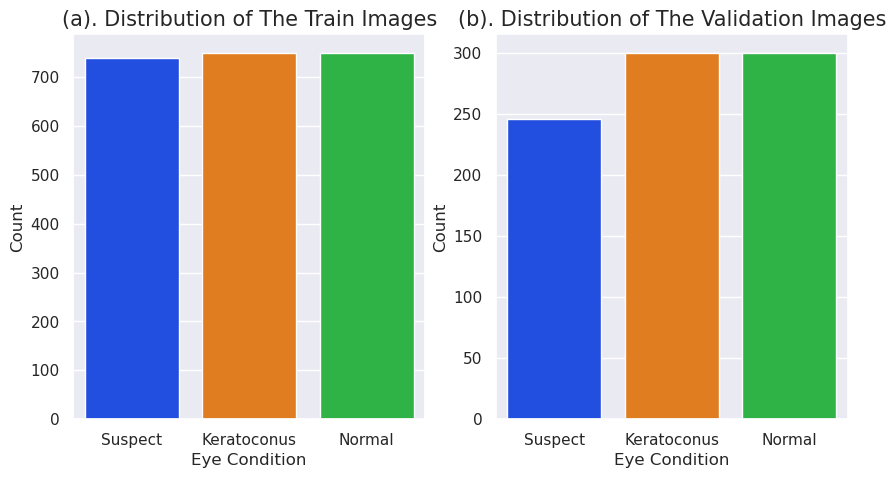

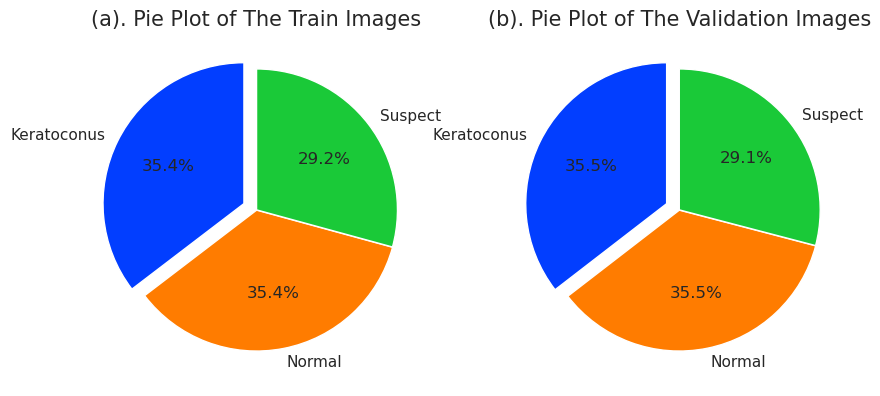

In [14]:
test_train_distribution(paths=[train_dir, val_dir])
visualizeData(train_dir, val_dir)

In [15]:
# Get the shape of the image
suspect_2=plt.imread(MOD_DATA+'/train/Suspect/oversampled/Suspect_2.jpg')
print(f'Image shape: {suspect_2.shape}')

Image shape: (224, 224, 3)


In [16]:
target_size=(224, 224)
batch_size=32

## Train Image Data Generator instance. 
# We will not apply any transformon specific orientations or features and no initial rescale to the image
# We'll only split the image data into train and validation set
trainValidation_data_generator = ImgDataGen(
                                            rotation_range=10,  # Randomly rotate images by up to 10 degrees
                                            zoom_range=0.2,  # Randomly zoom images by up to 20%
                                            width_shift_range=0.1,  # Randomly shift images horizontally by up to 10% of the image width
                                            height_shift_range=0.1,  # Randomly shift images vertically by up to 10% of the image height
                                            shear_range=0.2,  # Randomly apply shearing transformations
                                            horizontal_flip=True,  # Randomly flip images horizontally
                                            fill_mode='nearest',  # Fill in missing pixels with the nearest value
                                            )

validation_data_generator = ImgDataGen()
# Test Image Data Generator instance for Test data
test_data_generator = ImgDataGen()

# Set a random seed to synchronize the shuffle order across different runs of the generator
# trainValidation_data_generator.set_seed(42)


In [17]:
# Successfully mapped the train-images to their classes from the dataframe. Now let's do the same for the test-images. 
# Here, I will only be rescaling. No other transformations are applies, to preserve originality of the images.

mod_train_dir = MOD_DATA+"/train"
mod_val_dir = MOD_DATA+"/validation"
# print(mod_val_dir)

## Mapping images to their classes.
print('Train Set Generated - ',end=' ') 
train_generator = trainValidation_data_generator.flow_from_directory(
                                                            # directory=TRAIN_PATH, 
                                                            directory=mod_train_dir, 
                                                            target_size=target_size,
                                                            batch_size=batch_size,
                                                            class_mode='categorical', 
                                                            color_mode='rgb', 
#                                                             shuffle=False, 
                                                            # subset='training' # set as training data
                                                            # seed=1,
                                                        )
## Mapping images to their classes.
print('Validation Set Generated - ',end=' ') 
validation_generator = validation_data_generator.flow_from_directory(
                                                            # directory=TRAIN_PATH, 
                                                            directory=mod_val_dir, 
                                                            target_size=target_size,
                                                            batch_size=batch_size,
                                                            class_mode='categorical', 
                                                            color_mode='rgb', 
                                                            shuffle=False, 
                                                            # subset='validation' # set as validation data
                                                            # seed=1,
                                                        )
test=TEST_PATH
test_samples=class_sample(test)[0]
test_batch_size=batch_size
test_steps=int(test_samples/test_batch_size)

## Mapping images to their classes.
print('Test Set Generated - ',end=' ') 
test_generator = test_data_generator.flow_from_directory(
                                        TEST_PATH, 
                                        target_size=target_size,
                                        class_mode='categorical', 
                                        color_mode='rgb', 
                                        shuffle=False, 
                                        # seed=1,
                                        batch_size=batch_size
                                        )

# C:\Users\cmanj\OneDrive - University of Bradford\Documents\Project_Series\python_code\machine_learning\ml_keratoconus-detection\mod_data\validation

Train Set Generated -  Found 2238 images belonging to 3 classes.
Validation Set Generated -  Found 846 images belonging to 3 classes.
Test Set Generated -  Found 1050 images belonging to 3 classes.


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "more-on-data-analysis"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">More on Data Analysis
     </h1>
</div>

In [18]:
# From the generator we can get information we will need later
# classes=class_dir
class_dictionary = train_generator.class_indices
class_keys = list(train_generator.class_indices.keys())
class_values = list(train_generator.class_indices.values())
class_count = len(class_keys)
classes = class_keys

print ('test batch size: ' ,test_batch_size, '  test steps: ', test_steps, ' number of classes : ', class_count)

train_images, train_labels = next(train_generator)
validation_images, validation_labels = next(validation_generator)
test_images, test_labels = next(test_generator)


print('The 3 identified classes are: ',class_keys)
print(f'The class dictionary are: {class_dictionary}')
print('Class count: ', class_count)

print('\nX_train shape: ', train_images.shape)
print('y_train shape: ', train_labels.shape)

print('\nX_test shape: ', test_images.shape)
print('y_test shape: ', test_labels.shape)


test batch size:  32   test steps:  32  number of classes :  3
The 3 identified classes are:  ['Keratoconus', 'Normal', 'Suspect']
The class dictionary are: {'Keratoconus': 0, 'Normal': 1, 'Suspect': 2}
Class count:  3

X_train shape:  (32, 224, 224, 3)
y_train shape:  (32, 3)

X_test shape:  (32, 224, 224, 3)
y_test shape:  (32, 3)


In [19]:
class_indices = train_generator.class_indices
class_counts = {class_name: 0 for class_name in class_indices}
num_images = train_generator.samples

batch_size = train_generator.batch_size
num_batches = len(train_generator)

for i in range(num_batches):
    batch = next(train_generator)
    images, labels = batch
    for j in range(len(labels)):
        label = npy.argmax(labels[j])  # convert one-hot encoding to integer label
        class_name = list(class_indices.keys())[list(class_indices.values()).index(label)]
        class_counts[class_name] += 1

print(class_counts)
print(f"Total number of images in train generator: {num_images}")

{'Keratoconus': 747, 'Normal': 753, 'Suspect': 738}
Total number of images in train generator: 2238


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "more-on-data-visualization"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">More on Data Visualization
    </h1>
</div>

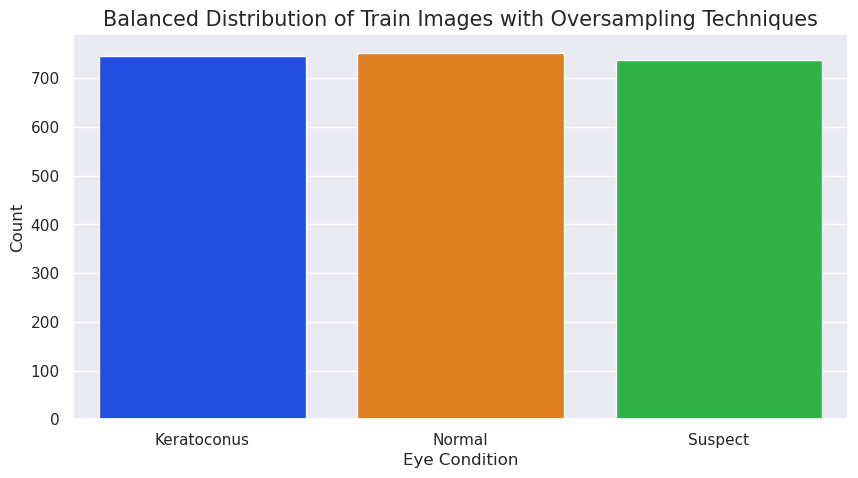

In [20]:
df_train_gen = pds.DataFrame(list(class_counts.items()), columns=['Condition', 'Count'])
df_train_gen.index.name = 'Condition'


# plot a barplot with vertical orientation
sns.set()
plt.figure(figsize=(10, 5))
sns.barplot(x='Condition', y='Count', data=df_train_gen, orient='v', palette='bright')
plt.xlabel("Eye Condition", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Balanced Distribution of Train Images with Oversampling Techniques", fontsize=15)
plt.show()

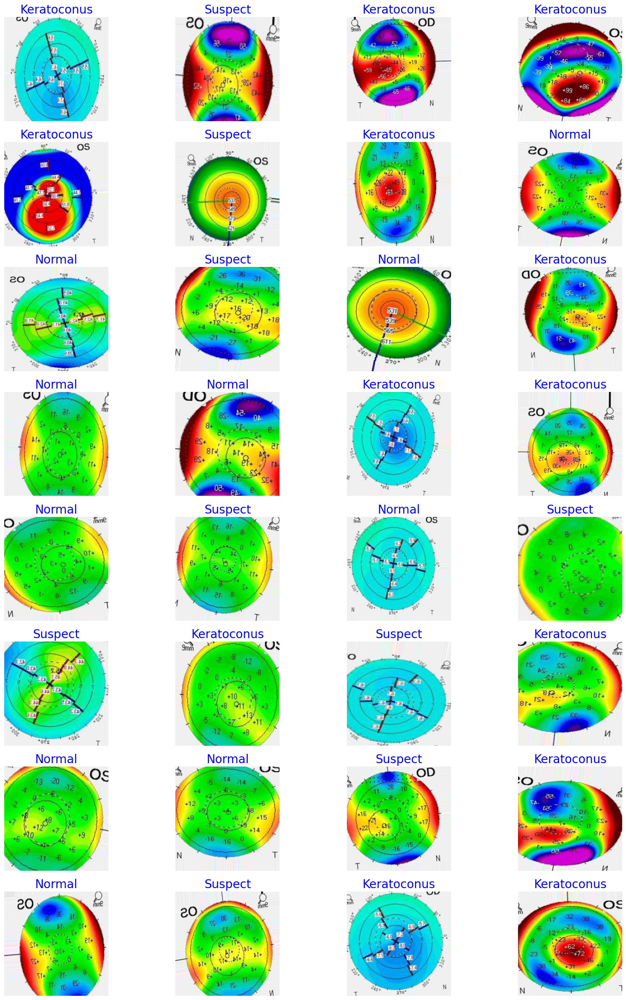

In [21]:
# Get the sample images, labels, and their filenames 
# To get the correct filename, turn off the shuffle
def plotImageWithNames(gen):
    images, labels = next(gen)
    filenames = gen.filenames
    classes = list(gen.class_indices.keys())
    
    plt.figure(figsize=(20, 30))
    length=len(labels)
    if length<32:  
        r=length
    else:
        r=32
    for i in range(r):        
        plt.subplot(8, 4, i + 1)
        image=images[i]/255 
        plt.imshow(image)
        index=npy.argmax(labels[i])
        class_name=classes[index]
        filename=gen.filenames[i]
        plt.title(
                    label=f"{class_name}", # "\n{filename} ", 
                    color='blue', 
                    fontsize=20
        )
        plt.axis('off')
    plt.show()

plotImageWithNames(train_generator)

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-development"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Development
    </h1>
</div>

In [22]:
from tensorflow import keras
from sklearn import set_config
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator as ImgDataGen
from tensorflow.keras.layers import Flatten, Dense, Dropout, Conv2D, MaxPooling2D, Activation, BatchNormalization
from tensorflow.keras.models import Sequential, load_model

from tensorflow.keras import layers, optimizers, metrics, regularizers, models
from tensorflow.keras.optimizers import Adam, Adamax
# from tensorflow.keras.metrics import categorical_crossentropy, sparse_categorical_crossentropy


In [23]:
# define the image shape for the input layer
input_shape=(target_size[0], target_size[1], 3)
batch_size = batch_size
epochs=25
ask_epoch=15

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-building-and-compiling"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Building and Compiling
    </h1>
</div>

In [24]:
import tensorflow as tf
from tensorflow.keras.models import Model
model_name='EfficientNetB4'
base_model=tf.keras.applications.efficientnet.EfficientNetB4(
                                                            include_top=False, 
                                                            weights="imagenet",
                                                            input_shape=input_shape, 
                                                            pooling='max'
                                                            ) 


# Let's make our base_model trainable to get better results
base_model.trainable=True
x=base_model.output

x=BatchNormalization(
                    axis=-1, 
                    momentum=0.99, 
                    epsilon=0.001,
                    name='batch_norm_x' 
                    )(x)
x = Dense(
          1024, 
          kernel_regularizer = regularizers.l2(l = 0.016),
          activity_regularizer=regularizers.l1(0.006),
          bias_regularizer=regularizers.l1(0.006),
          activation='relu',
          name='dense_x'
          )(x)

x=Dropout(
          rate=0.5, 
          seed=123,
          name='dropout_x'
          )(x) 
      
output=Dense(
            class_count, 
            activation='softmax',
            name='dense_output'
            )(x)
cnn_model=Model(inputs=base_model.input, outputs=output, name=model_name)
learning_rate=.001 # start with this learning rate
cnn_model.compile(
                  Adamax(learning_rate=learning_rate), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy']
                  )

# View the model summary
cnn_model.summary()

71686520/71686520 [==============================] - 4s 0us/step
Model: "EfficientNetB4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 224, 224, 3)  7          ['rescaling_2[0][0]']            
 )                                                                                                
                    

In [25]:
# Plot the Model Diagram
# set_config(display="diagram")
# from keras.utils.vis_utils import plot_model
# # !os.mkdir '../images'
# plot_model(cnn_model, to_file=model_arch(model_name), show_shapes=True)

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "create-a-custom-keras-callback-to-continue-or-halt-training"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;"> Create a Custom Keras Callback to Continue or Halt Training
    </h1>
</div>

In [26]:
# Code by https://www.kaggle.com/code/gpiosenka/callback-to-continue-or-halt-training-f1-90
class ASK(keras.callbacks.Callback):
    def __init__ (self, model, epochs,  ask_epoch): # initialization of the callback
        super(ASK, self).__init__()
        self.model=model               
        self.ask_epoch=ask_epoch
        self.subask_epoch = int(ask_epoch/2)
        self.epochs=epochs
        self.ask=True # if True query the user on a specified epoch
        
    def on_train_begin(self, logs=None): # this runs on the beginning of training
        if self.ask_epoch == 0: 
            print('you set ask_epoch = 0, ask_epoch will be set to 1', flush=True)
            self.ask_epoch=1
        if self.ask_epoch >= self.epochs: # you are running for epochs but ask_epoch>epochs
            print('ask_epoch >= epochs, will train for ', epochs, ' epochs', flush=True)
            self.ask=False # do not query the user
        if self.epochs == 1:
            self.ask=False # running only for 1 epoch so do not query user
        else:
            print('Training will proceed until epoch', ask_epoch,' then you will be asked to') 
            print(' enter H to halt training or enter an integer for how many more epochs to run then be asked again')  
        self.start_time= time.time() # set the time at which training started
        
    def on_train_end(self, logs=None):   # runs at the end of training     
        tr_duration=time.time() - self.start_time   # determine how long the training cycle lasted         
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print (msg, flush=True) # print out training duration time
        
    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        
        if self.ask: # are the conditions right to query the user?
            if epoch + 1 ==self.ask_epoch: # is this epoch the one for quering the user?
                print('\n Enter H to end training or  an integer for the number of additional epochs to run then ask again')
                ans=input()
                
                if ans == 'H' or ans =='h' or ans == '0': # quit training for these conditions
                    print ('you entered ', ans, ' Training halted on epoch ', epoch+1, ' due to user input\n', flush=True)
                    self.model.stop_training = True # halt training
                else: # user wants to continue training
                    self.ask_epoch += int(ans)
                    if self.ask_epoch > self.epochs:
                        print('\nYou earlier specified a maximum epochs of ', self.epochs, '\n, its seems that you want to train for a total of', self.ask_epoch,'\n\n Please confirm your action, please enter "Y", or "N" to end training at ', self.epochs)
                        ans=input()
                        
                        if ans == 'Y' or ans =='y':
                            self.epochs = self.ask_epoch
                        else:
                             print('\nYou specified maximum epochs of as ', self.epochs, ' cannot train for ', self.ask_epoch, flush =True)
                    else:
                        print ('you entered ', ans, ' Training will continue to epoch ', self.ask_epoch, flush=True)
                        
ask=ASK(cnn_model, epochs,  ask_epoch)

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "checkpoint-callback"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Checkpoint Callback
    </h1>
</div>

In [27]:
#  starting the Checkpoint for the model
# checkpoint_dir = os.path.dirname(checkpoint_path)

check_point = tf.keras.callbacks.ModelCheckpoint(
                                          filepath=checkpoint_path(model_name),
                                          save_weights_only=True,
                                          save_best_only=True, 
                                          monitor="val_accuracy",
                                          verbose = 1,
                                            )

reduce_learning = tf.keras.callbacks.ReduceLROnPlateau(
                                            monitor="val_accuracy", 
                                            # factor=0.5, 
                                            patience=2,
                                            verbose=1
                                            )

early_stop = tf.keras.callbacks.EarlyStopping(
                                       monitor="val_accuracy", 
                                       min_delta=0.0005,
                                       patience=11, 
                                       verbose=1,
                                       restore_best_weights=True
                                       )

callbacks = [
            check_point,
            reduce_learning, 
            early_stop, 
#             ask
          ]

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-training"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Training
    </h1>
</div>

In [28]:
model_history=cnn_model.fit(
                  train_generator,  
                  steps_per_epoch=train_generator.n//train_generator.batch_size,
                  epochs=epochs, 
                  verbose=1, 
                  callbacks=callbacks,  
                  validation_data=validation_generator,
                  validation_steps= validation_generator.n//validation_generator.batch_size,
                  )


Epoch 1/25


2023-06-20 10:25:33.344987: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inEfficientNetB4/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


69/69 [==============================] - ETA: 0s - loss: 20.4579 - accuracy: 0.5725
Epoch 1: val_accuracy improved from -inf to 0.68510, saving model to models/keratoconus_best_model-EfficientNetB4.ckpt
69/69 [==============================] - 127s 755ms/step - loss: 20.4579 - accuracy: 0.5725 - val_loss: 16.4219 - val_accuracy: 0.6851 - lr: 0.0010
Epoch 2/25
69/69 [==============================] - ETA: 0s - loss: 14.6133 - accuracy: 0.6414
Epoch 2: val_accuracy improved from 0.68510 to 0.68630, saving model to models/keratoconus_best_model-EfficientNetB4.ckpt
69/69 [==============================] - 46s 668ms/step - loss: 14.6133 - accuracy: 0.6414 - val_loss: 12.3957 - val_accuracy: 0.6863 - lr: 0.0010
Epoch 3/25
69/69 [==============================] - ETA: 0s - loss: 11.3407 - accuracy: 0.6881
Epoch 3: val_accuracy improved from 0.68630 to 0.69952, saving model to models/keratoconus_best_model-EfficientNetB4.ckpt
69/69 [==============================] - 44s 638ms/step - loss: 11.3

In [29]:

# 75/75 [==============================] - 
# 8s 103ms/step - loss: 0.5500 - accuracy: 0.7294 - val_loss: 0.8655 - val_accuracy: 0.7196 - lr: 1.0000e-09
# Model performed woefully when the training images were augmented
# 39s 524ms/step - loss: 1.0522 - accuracy: 0.4570 - val_loss: 1.0396 - val_accuracy: 0.5069 - lr: 1.0000e-23
# Using transfer learning model Effnet-B4,with train_set set to shuffle while valid_set and test_set set to false
# 74/74 [==============================] - 
# 50s 676ms/step - loss: 2.8592 - accuracy: 0.8117 - val_loss: 2.8813 - val_accuracy: 0.8125 - lr: 1.0000e-09
# Restoring model weights from the end of the best epoch: 9.
# 74/74 [==============================] - 48s 639ms/step - loss: 1.7965 - accuracy: 0.8383 - val_loss: 1.9538 - val_accuracy: 0.7934 - lr: 1.0000e-09

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "acuracy-and-loss-function-graph"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Accuracy and Loss Function Graph
    </h1>
</div>

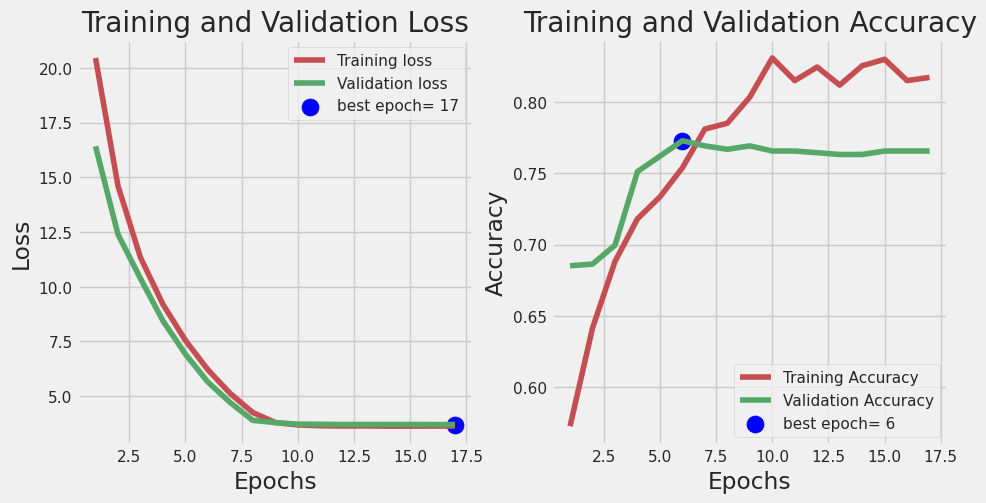

In [30]:
# Code by https://www.kaggle.com/code/gpiosenka/callback-to-continue-or-halt-training-f1-90
def trainValPlot(tr_data, start_epoch):
    # Plot the training and validation data
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)   
    index_loss=npy.argmin(vloss)   #   this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=npy.argmax(vacc)
    acc_highest=vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(10,5))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    plt.tight_layout    
    plt.show()
    
trainValPlot(model_history,0)


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-evaluation"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Evaluation
    </h1>
</div>

In [31]:
# Rebuild a fresh, untrained model and evaluate it on the test set. 
# An untrained model will perform at chance levels (~10% accuracy)
# Create a basic model instance
model = cnn_model

# Evaluate the model
loss, acc = model.evaluate(train_generator, verbose=2)

70/70 - 27s - loss: 5.5645 - accuracy: 0.7967 - 27s/epoch - 392ms/step


In [32]:
# Rebuild a fresh, untrained model and evaluate it on the test set. 
# An untrained model will perform at chance levels (~10% accuracy)
# Create a basic model instance
model = cnn_model

# Evaluate the model
loss, acc = model.evaluate(validation_generator, verbose=2)

27/27 - 3s - loss: 5.6451 - accuracy: 0.7719 - 3s/epoch - 104ms/step


Load the weights from the saved checkpoint and evaluate

In [33]:
# Loads the weights
cnn_model.load_weights(checkpoint_path(model_name=model_name))

# Re-evaluate the model
loss, acc = cnn_model.evaluate(validation_generator, verbose=2)
print("Restored model, validation accuracy: {:5.2f}%".format(100 * acc))

27/27 - 3s - loss: 5.6451 - accuracy: 0.7719 - 3s/epoch - 95ms/step
Restored model, validation accuracy: 77.19%


In [34]:
# Loads the weights
cnn_model.load_weights(checkpoint_path(model_name))

# Re-evaluate the model
loss, acc = cnn_model.evaluate(test_images, test_labels, verbose=2)
print("Restored model, accuracy on New Test data: {:5.2f}%".format(100 * acc))

1/1 - 0s - loss: 5.7488 - accuracy: 0.7500 - 135ms/epoch - 135ms/step
Restored model, accuracy on New Test data: 75.00%


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "prediction-on-test-images"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Prediction on Test Images
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#prediction-on-test-images">¶</a>
    </h1>
</div>

In [35]:
# 
def ModelPredictionOnTestDataset(test_generator, suffix=''):
#     test_steps= test_generator.n//test_generator.batch_size
    y_pred= []
    y_label=test_generator.labels
    classes=list(train_generator.class_indices.keys())
    class_count=len(classes)
    wrong_predictions=0
    
    # predict on the test set
    preds=cnn_model.predict(test_generator, test_steps, verbose=1) 
    
    total_predictions=len(preds)
    print(f'total prediction: {total_predictions}')
    for i, p in enumerate(preds):
            pred_index=npy.argmax(p)  
            # labels are integer values       
            true_index=test_generator.labels[i]  
            if pred_index != true_index:       
                # a misclassification has occurred                                     
                wrong_predictions=wrong_predictions + 1
            y_pred.append(pred_index)
    acc=( 1-wrong_predictions/total_predictions) * 100
    print(f'\n{wrong_predictions} out of {total_predictions} tested images could not be detected properly.\nAccuracy of {acc:6.2f}\n')
    ypred=npy.array(y_pred)
    ytrue=npy.array(y_label)
    if class_count <=30:
        cm = confusion_matrix(ytrue, ypred )
        # plot the confusion matrix
        plt.figure(figsize=(8, 4))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
        plt.xticks(npy.arange(class_count)+.5, classes, rotation=90)
        plt.yticks(npy.arange(class_count)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix on "+suffix.capitalize()+" Data", fontsize=15)
        plt.show()
    clr = classification_report(y_label, y_pred, target_names=classes, digits= 5) # create classification report
    print(f"Classification Report on {suffix.capitalize()} Data:\n-------------------------------------\n", clr)

    return wrong_predictions, total_predictions


27/27 [==============================] - 6s 92ms/step
total prediction: 846

193 out of 846 tested images could not be detected properly.
Accuracy of  77.19



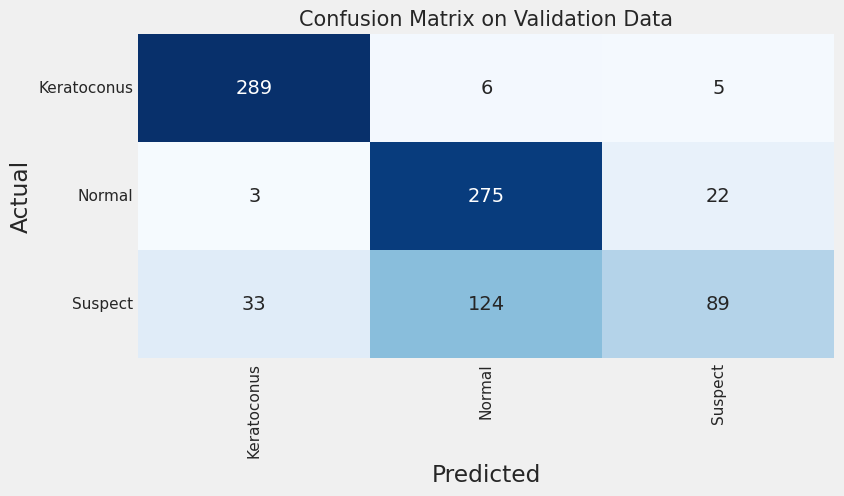

Classification Report on Validation Data:
-------------------------------------
               precision    recall  f1-score   support

 Keratoconus    0.88923   0.96333   0.92480       300
      Normal    0.67901   0.91667   0.78014       300
     Suspect    0.76724   0.36179   0.49171       246

    accuracy                        0.77187       846
   macro avg    0.77849   0.74726   0.73222       846
weighted avg    0.77921   0.77187   0.74757       846



In [36]:
# Prediction on Validation set
wrong_val_predictions, total_val_predictions = ModelPredictionOnTestDataset(validation_generator, suffix = 'validation')

33/33 [==============================] - 6s 179ms/step
total prediction: 1050

462 out of 1050 tested images could not be detected properly.
Accuracy of  56.00



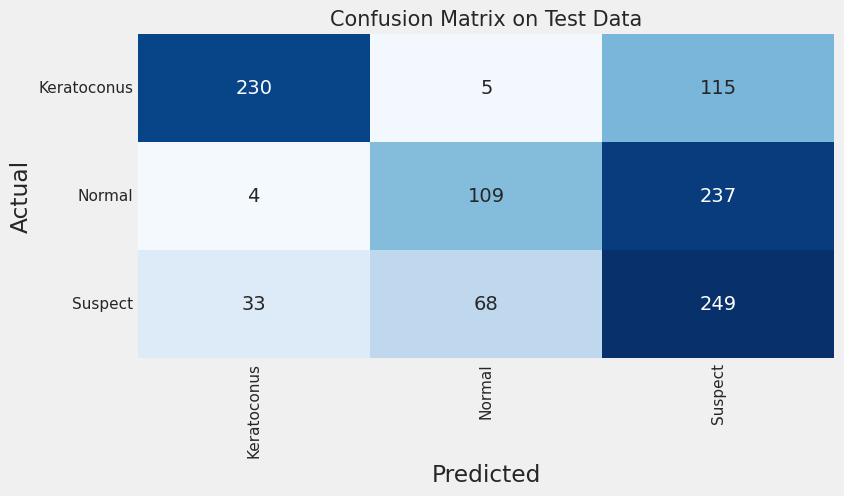

Classification Report on Test Data:
-------------------------------------
               precision    recall  f1-score   support

 Keratoconus    0.86142   0.65714   0.74554       350
      Normal    0.59890   0.31143   0.40977       350
     Suspect    0.41431   0.71143   0.52366       350

    accuracy                        0.56000      1050
   macro avg    0.62488   0.56000   0.55966      1050
weighted avg    0.62488   0.56000   0.55966      1050



In [37]:
# Prediction on the Test set
wrong_test_predictions, total_test_predictions = ModelPredictionOnTestDataset(test_generator, suffix = 'test')

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "verify-predictions"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Verify Predictions
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#verify-predictions">¶</a>
    </h1>
</div>

In [38]:
# 
def compare(label_prep, gen=train_generator):
    class_dictionary = gen.class_indices
    for key, value in class_dictionary.items():
        if value == label_prep:
             return key

def dif(label_test, label_prep, gen=train_generator):    
    class_dictionary = gen.class_indices
    test = ''
    id = ''
    for key, value in class_dictionary.items():
        if value == label_test:
            test = key
        if value == label_prep:
            id = key
    return test, id

# Verify the predicted images Function
def verifyPredictions(gentype = 'test'):
    if gentype.lower() == 'test' or gentype.lower() == 'validation':
        generator = ''
        if gentype.lower() == 'validation':
            generator = validation_generator
        else:
            generator = test_generator
        test_images, test_labels = next(generator)
        preds = cnn_model.predict(test_images)
        # One hot conversion
        label_prep = npy.argmax(preds, axis = 1)
        label_test = npy.argmax(test_labels, axis = 1)
        # Reshape
        label_prep = label_prep.reshape((-1, 1))
        label_test = npy.reshape(label_test, (len(label_test), 1))

        print(f"Batch prediction for {gentype} set: {npy.sum((label_test == label_prep)*1)/test_batch_size}\n")

        # Print the result
        fig = plt.figure(figsize=((20, 30)))
        for j in range(len(label_prep)):
            ax = plt.subplot(8, 4, j+1)
            px = test_images[j]/255
            ax.imshow(px)
            ax.set_xticks([])
            ax.set_yticks([])

            if label_test[j] == label_prep[j]:
                for axis in ['top','bottom','left','right']:
                    ax.spines[axis].set_linewidth(10)
                    ax.spines[axis].set_color('green')
                ax.set_title(
                            compare(label_prep[j]),
                            color='green', 
                            fontsize=20
                             )
            else:
                for axis in ['top','bottom','left','right']:
                    ax.spines[axis].set_linewidth(10)
                    ax.spines[axis].set_color('red')
                ax.set_title(
                            'Pred:'+dif(label_test[j], label_prep[j])[1]+" | Act:"+ dif(label_test[j], label_prep[j])[0],
                            color='red', 
                            fontsize=20
                            )
            plt.tight_layout()

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "verify-predictions-on-validation-images"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Verify Predictions on Validation Images
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#verify-predictions-on-validation-images">¶</a>
    </h1>
</div>

1/1 [==============================] - 3s 3s/step
Batch prediction for validation set: 1.0



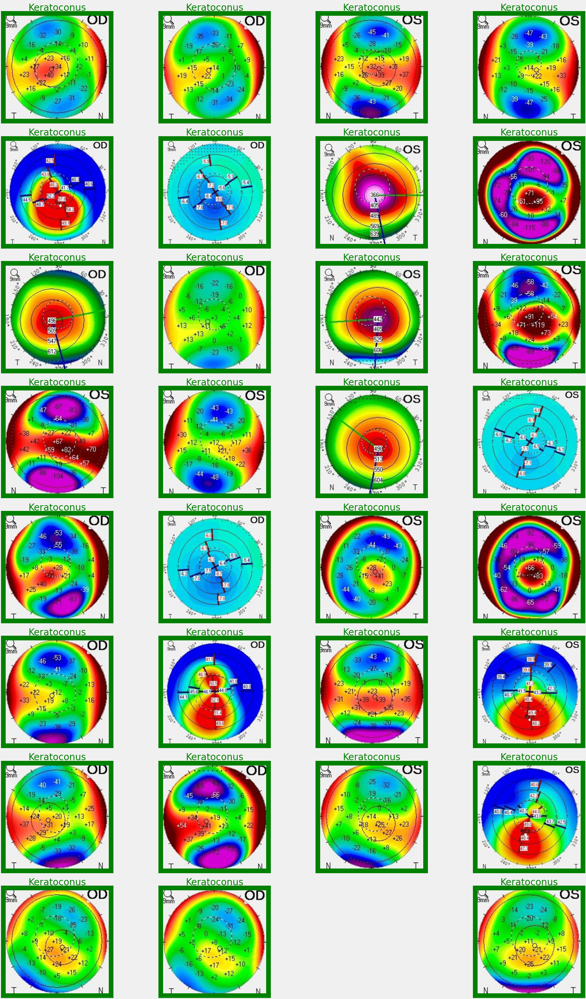

In [39]:
# Verify the predicted images for validation set
verifyPredictions('validation')

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "verify-predictions-on-new-test-images"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Verify Predictions on New (Test) Images
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#verify-predictions-on-new-test-images">¶</a>
    </h1>
</div>

1/1 [==============================] - 0s 47ms/step
Batch prediction for test set: 0.6875



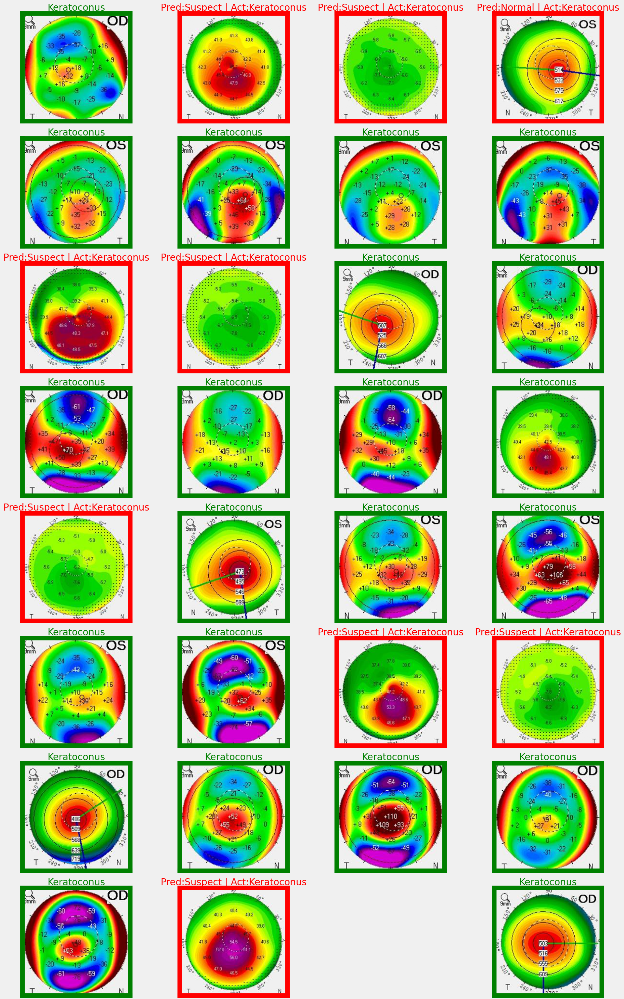

In [40]:
# Verify the predicted images for test set
verifyPredictions()